In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [2]:
from termcolor import colored
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Display pandas df without truncation
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [4]:
# Globally setting font sizes via rcParams should be done with 

# #paper params
# params = {
#     'font.size': 18,
#     'figure.figsize': (7,3.5),
#     'figure.dpi': 80,
#     'savefig.dpi': 300,
#     'legend.fontsize': 11,
#     'xtick.labelsize': 11,
#     'ytick.labelsize': 11,
#     'axes.labelsize': 11,
#     'axes.axisbelow': True
#          }

#test params
params = {
    'font.size': 18,
    'figure.figsize': (15,5),
    'figure.dpi': 160,
    'savefig.dpi': 300,
    'legend.fontsize': 11,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'axes.labelsize': 11,
    'axes.axisbelow': True
         }


plt.rcParams.update(params)

# The defaults can be restored using
# plt.rcParams.update(plt.rcParamsDefault)

### Numpy array, select even/odd columns

[:,::2]    Xs cols indexing


[:,1::2]   Ys cols indexing

In [5]:
def check_float(potential_float):
    try:
        float(potential_float)
        return True

    except ValueError:
        return False

### ARK —> ARGoS coordinate system

In [6]:
ARENA_SIZE = 1875
M_TO_PIXEL = 20
CM_TO_M = 100

In [7]:
def x_transform(x_array):
    x_trans = ((x_array - (ARENA_SIZE/2))/ M_TO_PIXEL)/CM_TO_M
    return x_trans
    

In [8]:
def y_transform(y_array):
    y_trans = (((ARENA_SIZE/2) - y_array)/ M_TO_PIXEL) /CM_TO_M
    return y_trans

### Exp parameters

In [9]:
fieldsPerKilobot = 6
experiment_length = 1800

In [10]:
main_folder = os.getcwd()
folder_experiments = 'results'

In [11]:
def generate_kiloLOG_label(n_rob):
    kiloLOG_label = ['time']
    for i in range(0, n_rob*fieldsPerKilobot, fieldsPerKilobot):
        kiloLOG_label += ['id' + str(i // fieldsPerKilobot), 'col' + str(i // fieldsPerKilobot), 'posx' + str(i // fieldsPerKilobot), 'posy' + str(i // fieldsPerKilobot), 'ori' + str(i // fieldsPerKilobot), 'state' + str(i // fieldsPerKilobot)]
    
    return kiloLOG_label

In [12]:
def generate_kiloPOS_label(n_rob):
    kiloPOS_label = []
    for i in range(n_rob):
        kiloPOS_label += ["posx"+str(i),"posy"+str(i)]
        
    return kiloPOS_label

## Main

In [13]:
window_size = 10

DirName: /home/luigi/Documents/ARGoS/argos-LMCRW-script/results/JAN_2022/20#robots_alpha#2.0_rho#0.9
num_robots 20, rho 0.9, alpha 2.0

differentSeeds_wmsd.shape:  (5, 180)
differentSeeds_wmsd_mean.shape:  (180,)


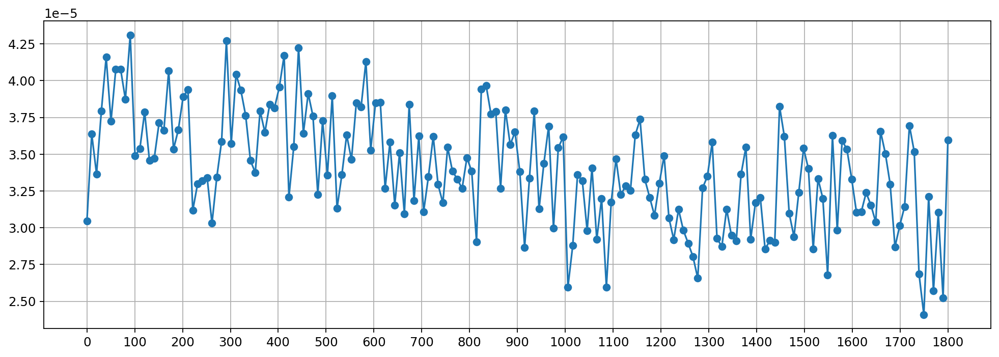

DirName: /home/luigi/Documents/ARGoS/argos-LMCRW-script/results/20#robots_alpha#2.0_rho#0.9
num_robots 20, rho 0.9, alpha 2.0

differentSeeds_wmsd.shape:  (17, 180)
differentSeeds_wmsd_mean.shape:  (180,)


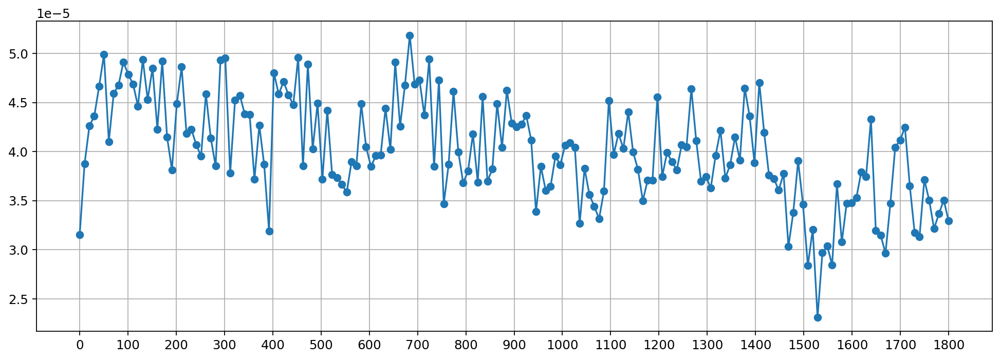

In [14]:
for dirName, subdirList, fileList in os.walk(os.path.join(main_folder,'results')):
    
    if dirName.split("/")[-1] != '20#robots_alpha#2.0_rho#0.9':
        continue
    
    num_robots = "-1"
    rho = -1.0
    alpha = -1.0
    elements = dirName.split("/")[-1].split("_")
#     print(colored("DirName:", 'blue'),dirName)
#     print(elements)
    for e in elements:
        if e.endswith("robots"):
            num_robots = e.split("#")[0]

        if (e.startswith("rho")):
            if check_float(e.split("#")[-1]): rho = float(e.split("#")[-1])
        if (e.startswith("alpha")):
            if check_float(e.split("#")[-1]): alpha = float(e.split("#")[-1])
    
    if num_robots == "-1" or rho == -1.0 or alpha == -1:
        continue
    
    print(colored("DirName:", 'blue'),dirName)
    print('num_robots {}, rho {}, alpha {}'.format(num_robots, rho, alpha), end='\n\n')
        
        
    differentSeeds_wmsd = np.array([])
    
    for filename in fileList:
        if filename.endswith('kilopos.txt'):
#             print('\t', filename)
            if not os.path.getsize(os.path.join(dirName, filename)) > 0:
                print("Error, empty file at:" + os.path.join(fileList, filename))
                continue
            df_single = pd.read_csv(os.path.join(dirName, filename), sep="\t", header=None)
            kiloLOG_label = generate_kiloLOG_label(int(num_robots))
            df_single.columns = kiloLOG_label
#             df_single = df_single[df_single['time'] < experiment_length+1]
            kiloPOS_label = generate_kiloPOS_label(int(num_robots))
    
            '''*****************************************************************************************************'''    
            #così è diviso in ordine del tempo
            np_position = df_single[kiloPOS_label].to_numpy()
            np_position[:,::2] = x_transform(np_position[:,::2])
            np_position[:,1::2] = y_transform(np_position[:,1::2])
            np_position = np_position.reshape(df_single.shape[0], int(num_robots), -1)
            np_position = np_position[:experiment_length+1]
            
            msd_array = np.array([])
            

            for f in range(window_size, np_position.shape[0], window_size):
#                 print('tf: {}, ti: {}'.format(f, f - window_size))
                tf = np_position[f]
                ti = np_position[f - window_size]
#                 print('tf.shape:', tf.shape)
                sq_distance = np.sum((tf - ti) ** 2, axis=1)
                wmsd = np.true_divide(sq_distance, window_size ** 2)

                msd_array = np.row_stack([msd_array, wmsd]) if msd_array.size else wmsd

            msd_array = np.mean(msd_array, axis=1)
#             print('msd_array.shape', msd_array.shape)
            differentSeeds_wmsd = np.row_stack([differentSeeds_wmsd, msd_array]) if differentSeeds_wmsd.size else msd_array
            
#             #fin qui perfetto, però ricorda che lo devi fare per i diversi seed e devi farne la media
            # w_displacement_array = np.mean(msd_array, axis=0)
            
        
    differentSeeds_wmsd_mean = np.mean(differentSeeds_wmsd, axis=0)
    print('differentSeeds_wmsd.shape: ', differentSeeds_wmsd.shape)
    print('differentSeeds_wmsd_mean.shape: ', differentSeeds_wmsd_mean.shape)
    fig = plt.figure(facecolor='w', edgecolor='k')
    plt.grid()

    times = np.linspace(0, experiment_length, len(differentSeeds_wmsd_mean), endpoint=True)
    plt.plot(times, msd_array, label=6, marker='o')

    # fig.legend(loc=7, bbox_to_anchor=(0.95, 0.5))
    plt.xticks(np.arange(0, experiment_length+100, 100))
    # plt.ylim((0, 0.001))
    # plt.title(
    # msd_type + ", with " + r"$\bf{Robots}:$" + num_robots + r" $\bf{\rho}:$" + rho + " and " + r"$\bf{\alpha}:$" + alpha)
    # plt.ylabel(msd_type)
    # plt.xlabel('time(s)')
    plt.show()


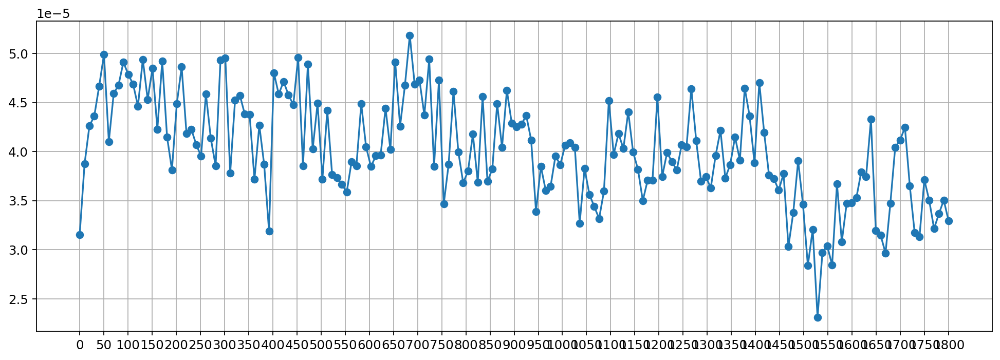

In [15]:
differentSeeds_wmsd_mean = np.mean(differentSeeds_wmsd, axis=0)
fig = plt.figure(facecolor='w', edgecolor='k')
plt.grid()

times = np.linspace(0, experiment_length, len(differentSeeds_wmsd_mean), endpoint=True)
plt.plot(times, msd_array, label=6, marker='o')

# fig.legend(loc=7, bbox_to_anchor=(0.95, 0.5))
plt.xticks(np.arange(0, experiment_length+50, 50))
# plt.ylim((0, 0.001))
# plt.title(
# msd_type + ", with " + r"$\bf{Robots}:$" + num_robots + r" $\bf{\rho}:$" + rho + " and " + r"$\bf{\alpha}:$" + alpha)
# plt.ylabel(msd_type)
# plt.xlabel('time(s)')
plt.show()

In [16]:
#così è diviso in ordine del tempo
np_position = df_single[kiloPOS_label].to_numpy()
np_position[:,::2] = x_transform(np_position[:,::2])
np_position[:,1::2] = y_transform(np_position[:,1::2])
np_position = np_position.reshape(df_single.shape[0], int(num_robots), -1)

In [17]:
np_position.shape

(1900, 20, 2)

In [18]:
np_position.shape[0]

1900

In [19]:
msd_array = np.array([])
window_size = 20

for f in range(window_size, np_position.shape[0], window_size):
    print('tf: {}, ti: {}'.format(f, f - window_size))
    tf = np_position[f]
    ti = np_position[f - window_size]
    print('tf.shape:', tf.shape)
    sq_distance = np.sum((tf - ti) ** 2, axis=1)
    wmsd = np.true_divide(sq_distance, window_size ** 2)
    print('wmsd.shape:', wmsd.shape)
    
    msd_array = np.row_stack([msd_array, wmsd]) if msd_array.size else wmsd

msd_array = np.mean(msd_array, axis=1)
#fin qui perfetto, però ricorda che lo devi fare per i diversi seed e devi farne la media
# w_displacement_array = np.mean(msd_array, axis=0)
    

tf: 20, ti: 0
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 40, ti: 20
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 60, ti: 40
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 80, ti: 60
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 100, ti: 80
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 120, ti: 100
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 140, ti: 120
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 160, ti: 140
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 180, ti: 160
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 200, ti: 180
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 220, ti: 200
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 240, ti: 220
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 260, ti: 240
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 280, ti: 260
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 300, ti: 280
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 320, ti: 300
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 340, ti: 320
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 360, ti: 340
tf.shape: (20, 2)
wmsd.shape: (20,)
tf: 380, ti: 360
tf.shape: (20, 2)
wmsd.shape: (20,)
tf:

In [20]:
np.linspace(0, experiment_length, len(msd_array), endpoint=True)

array([   0.        ,   19.35483871,   38.70967742,   58.06451613,
         77.41935484,   96.77419355,  116.12903226,  135.48387097,
        154.83870968,  174.19354839,  193.5483871 ,  212.90322581,
        232.25806452,  251.61290323,  270.96774194,  290.32258065,
        309.67741935,  329.03225806,  348.38709677,  367.74193548,
        387.09677419,  406.4516129 ,  425.80645161,  445.16129032,
        464.51612903,  483.87096774,  503.22580645,  522.58064516,
        541.93548387,  561.29032258,  580.64516129,  600.        ,
        619.35483871,  638.70967742,  658.06451613,  677.41935484,
        696.77419355,  716.12903226,  735.48387097,  754.83870968,
        774.19354839,  793.5483871 ,  812.90322581,  832.25806452,
        851.61290323,  870.96774194,  890.32258065,  909.67741935,
        929.03225806,  948.38709677,  967.74193548,  987.09677419,
       1006.4516129 , 1025.80645161, 1045.16129032, 1064.51612903,
       1083.87096774, 1103.22580645, 1122.58064516, 1141.93548

(0.0, 0.001)

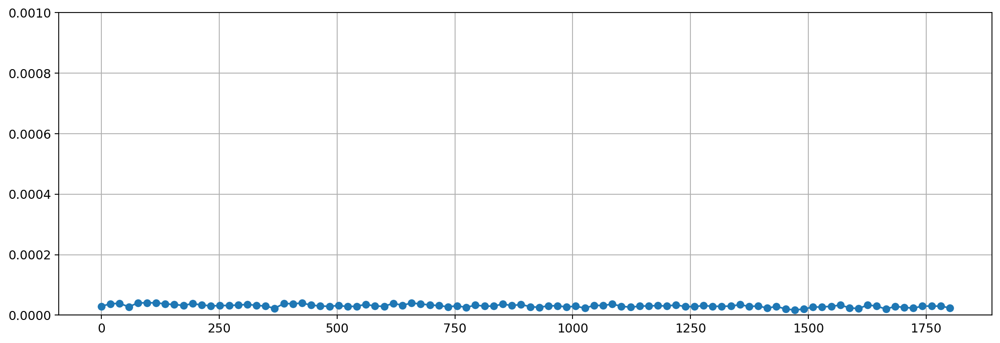

In [21]:
fig = plt.figure(facecolor='w', edgecolor='k')
plt.grid()

times = np.linspace(0, experiment_length, len(msd_array), endpoint=True)
plt.plot(times, msd_array, label=6, marker='o')

# fig.legend(loc=7, bbox_to_anchor=(0.95, 0.5))
# plt.xticks(np.arange(0, 1900, 200))
plt.ylim((0, 0.001))
# plt.title(
# msd_type + ", with " + r"$\bf{Robots}:$" + num_robots + r" $\bf{\rho}:$" + rho + " and " + r"$\bf{\alpha}:$" + alpha)
# plt.ylabel(msd_type)
# plt.xlabel('time(s)')

In [22]:
df_single

,time,id0,col0,posx0,posy0,ori0,state0,id1,col1,posx1,posy1,ori1,state1,id2,col2,posx2,posy2,ori2,state2,id3,col3,posx3,posy3,ori3,state3,id4,col4,posx4,posy4,ori4,state4,id5,col5,posx5,posy5,ori5,state5,id6,col6,posx6,posy6,ori6,state6,id7,col7,posx7,posy7,ori7,state7,id8,col8,posx8,posy8,ori8,state8,id9,col9,posx9,posy9,ori9,state9,id10,col10,posx10,posy10,ori10,state10,id11,col11,posx11,posy11,ori11,state11,id12,col12,posx12,posy12,ori12,state12,id13,col13,posx13,posy13,ori13,state13,id14,col14,posx14,posy14,ori14,state14,id15,col15,posx15,posy15,ori15,state15,id16,col16,posx16,posy16,ori16,state16,id17,col17,posx17,posy17,ori17,state17,id18,col18,posx18,posy18,ori18,state18,id19,col19,posx19,posy19,ori19,state19
0,0.000,0,3,334.5,1209.5,0.000000e+00,0,1,1,812.5,1084.5,0.000000,0,2,1,824.5,1351.5,0.000000e+00,0,3,1,527.5,1015.5,0.000000e+00,0,4,1,1358.5,456.5,0.000000,0,5,1,1148.5,1246.5,0.000000e+00,0,6,1,310.5,853.5,0.000000e+00,0,7,1,1480.5,737.5,0.000000e+00,0,8,1,1450.5,1503.5,0.000000e+00,0,9,1,1152.5,902.5,0.000000,0,10,1,776.5,802.5,0.000000,0,11,1,1528.5,1044.5,0.000000e+00,0,12,1,1133.5,616.5,0.000000e+00,0,13,1,665.5,446.5,0.000000e+00,0,14,1,1537.5,1303.5,0.000000,0,15,1,481.5,735.5,0.000000e+00,0,16,1,966.5,351.5,0.000000e+00,0,17,1,1164.5,1554.5,0.000000,0,18,1,856.5,1637.5,0.000000,0,19,1,510.5,1465.5,0.000000,0
1,0.986,0,0,333.5,1208.5,1.300610e+02,0,1,0,812.5,1086.5,33.138500,0,2,0,826.5,1349.5,1.582330e+01,0,3,0,529.5,1020.5,-2.439500e+01,0,4,0,1358.5,457.5,-105.094000,0,5,0,1147.5,1246.5,4.500000e+01,0,6,0,306.5,856.5,-1.392680e+02,0,7,0,1477.5,740.5,-1.360720e+02,0,8,0,1451.5,1501.5,-1.330520e+01,0,9,0,1154.5,902.5,-49.369600,0,10,0,774.5,801.5,126.852000,0,11,0,1527.5,1045.5,-1.251660e+02,0,12,0,1132.5,613.5,9.974940e+01,0,13,0,667.5,445.5,3.649750e+01,0,14,0,1538.5,1300.5,-42.369900,0,15,0,484.5,740.5,-8.209700e+01,0,16,0,969.5,348.5,3.218590e+01,0,17,0,1163.5,1554.5,-84.576800,0,18,0,854.5,1637.5,15.877400,0,19,0,510.5,1462.5,82.428400,0
2,1.986,0,0,320.5,1209.5,-1.797760e+02,0,1,0,796.5,1088.5,-165.091000,0,2,0,844.5,1346.5,1.500330e+01,0,3,0,525.5,1031.5,-9.896130e+01,0,4,0,1354.5,452.5,124.340000,0,5,0,1153.5,1238.5,5.647250e+01,0,6,0,304.5,868.5,-1.066030e+02,0,7,0,1472.5,752.5,-1.080410e+02,0,8,0,1454.5,1498.5,4.659110e+01,0,9,0,1149.5,915.5,-107.188000,0,10,0,767.5,810.5,-132.546000,0,11,0,1529.5,1045.5,1.299460e+01,0,12,0,1137.5,610.5,4.613820e+01,0,13,0,659.5,453.5,-1.429220e+02,0,14,0,1542.5,1297.5,20.282600,0,15,0,495.5,741.5,-3.153020e+01,0,16,0,975.5,345.5,1.501840e+01,0,17,0,1171.5,1545.5,64.885200,0,18,0,836.5,1630.5,159.597000,0,19,0,519.5,1459.5,19.104500,0
3,3.017,0,0,309.5,1210.5,-1.668660e+02,0,1,0,781.5,1094.5,-169.905000,0,2,0,859.5,1343.5,6.549090e+00,0,3,0,523.5,1048.5,-9.274160e+01,0,4,0,1353.5,436.5,84.610700,0,5,0,1159.5,1225.5,6.807820e+01,0,6,0,300.5,877.5,-1.133300e+02,0,7,0,1469.5,756.5,-1.176690e+02,0,8,0,1464.5,1493.5,2.431930e+01,0,9,0,1148.5,926.5,-99.353000,0,10,0,764.5,823.5,-93.551700,0,11,0,1533.5,1040.5,4.450180e+01,0,12,0,1147.5,603.5,2.645740e+01,0,13,0,656.5,464.5,-1.067650e+02,0,14,0,1551.5,1288.5,41.091500,0,15,0,510.5,753.5,-3.292050e+01,0,16,0,984.5,346.5,-7.570890e+00,0,17,0,1183.5,1533.5,41.051300,0,18,0,820.5,1619.5,149.036000,0,19,0,531.5,1454.5,17.650100,0
4,3.986,0,0,301.5,1207.5,1.693510e+02,0,1,0,764.5,1093.5,-155.214000,0,2,0,868.5,1342.5,9.727580e+00,0,3,0,518.5,1063.5,-1.070910e+02,0,4,0,1346.5,431.5,138.814000,0,5,0,1163.5,1215.5,6.658570e+01,0,6,0,301.5,887.5,-8.746030e+01,0,7,0,1460.5,764.5,-1.408600e+02,0,8,0,1471.5,1494.5,-1.054400e+00,0,9,0,1146.5,939.5,-105.841000,0,10,0,765.5,834.5,-108.364000,0,11,0,1536.5,1034.5,6.070100e+01,0,12,0,1152.5,594.5,4.380150e+01,0,13,0,647.5,471.5,-1.317750e+02,0,14,0,1558.5,1285.5,41.496500,0,15,0,520.5,758.5,-2.516610e+01,0,16,0,991.5,345.5,2.878370e+00,0,17,0,1191.5,1523.5,52.586200,0,18,0,806.5,1614.5,160.138000,0,19,0,542.5,1451.5,8.960420,0
5,4.986,0,0,291.5,1205.5,1.694010e+02,0,1,0,751.5,1090.5,158.